<a href="https://colab.research.google.com/github/ajakhmol/CNN/blob/main/CycleGAN_MRI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## MRI Conversion from T1 to T2 using CycleGAN

### Pipeline
The Sequence of the Project

1. Importing Libraries
2. Data Loading and Visualization
3. Data Preprocessing
4. Model Building
5. Model Training
6. Generating a GIF

### Import Libraries


In [3]:
import os # Import the os module to access listdir function
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import imageio
import glob
from numpy import asarray
from skimage.transform import resize
from tensorflow.keras.utils import plot_model
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img

### Data Loading and Visualization
1. Data Loading
2. Data Visualization

#### Data Loading

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
def load_images(path, size=(256,256)):
    data_list = list()
    for filename in os.listdir(path):
        pixels = load_img(os.path.join(path, filename), target_size=size)
        pixels = img_to_array(pixels)
        data_list.append(pixels)
    return asarray(data_list)


In [6]:
def img_to_tensor(path):
  tr_data = load_images(path)  # Pass the Path object directly
  tr_data = tf.image.rgb_to_grayscale(tr_data)  # convert to grayscale
  tr_data = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(tr_data))
  return tr_data


In [7]:
# load dataset tr2
t1_path="/content/drive/MyDrive/MRI_T1_T2_Dataset/Tr1/TrainT1/"
tr1_data = img_to_tensor(t1_path)  # Pass the Path object directly
tr1_data

<_TensorSliceDataset element_spec=TensorSpec(shape=(256, 256, 1), dtype=tf.float32, name=None)>

In [8]:
# load dataset tr2
t2_path="/content/drive/MyDrive/MRI_T1_T2_Dataset/Tr2/TrainT2/"
tr2_data = img_to_tensor(t2_path)  # Pass the Path object directly
tr2_data

<_TensorSliceDataset element_spec=TensorSpec(shape=(256, 256, 1), dtype=tf.float32, name=None)>

Declare Batch Size

In [9]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1

### Data Preprocessing
1.   Data Resizing
2.   Data Reshaping
3.   Batch and Shuffle Data

In [10]:
# normalizing the images to [-1, 1]
def normalize(image):
    image =  tf.cast(image, tf.float32)
    image= (image / 127.5) - 1
    return image

In [11]:
def preprocess_image_train(image):
    image = tf.image.random_flip_left_right(image)
    image = normalize(image)
    return image

In [12]:
# process both classes of MRI images
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
tr1_data = tr1_data.map(preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
tr2_data = tr2_data.map(preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [13]:
sample_tr1_data = next(iter(tr1_data))
sample_tr2_data = next(iter(tr2_data))

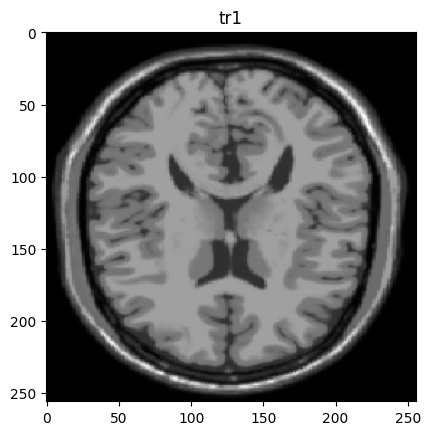

In [14]:
plt.title('tr1')
plt.imshow(sample_tr1_data[0].numpy()[:, :,0] * 0.5 + 0.5, cmap='gray')

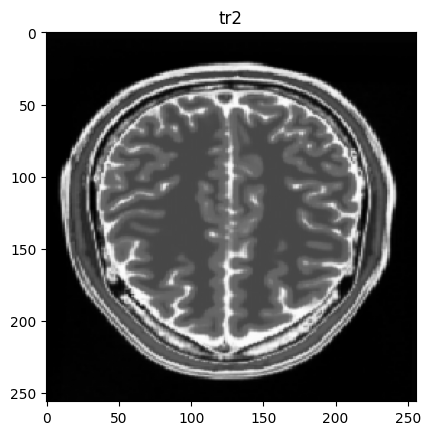

In [15]:
plt.title('tr2')
plt.imshow(sample_tr2_data[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')

### Model Building
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

#### Instance Normalization
Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.

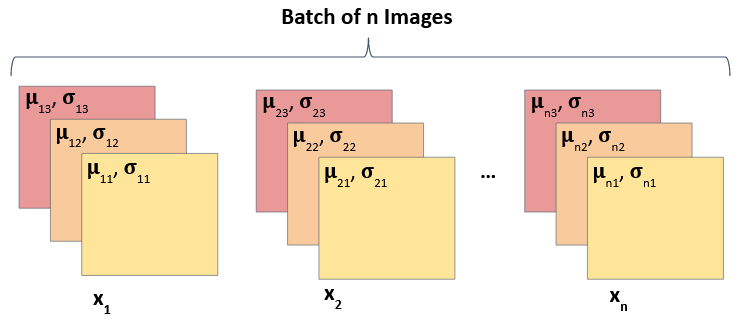

In [16]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

#### Downsampling
Downsampling is performed using the Convolution, leading to reduce in dimensions.

In [17]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

#### Upsampling
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [18]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

#### Unets
Unets takes Image as an input and translate it into another Image. <p>
To do this they first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image. <p>
Let's understand it through the below image.

<center>

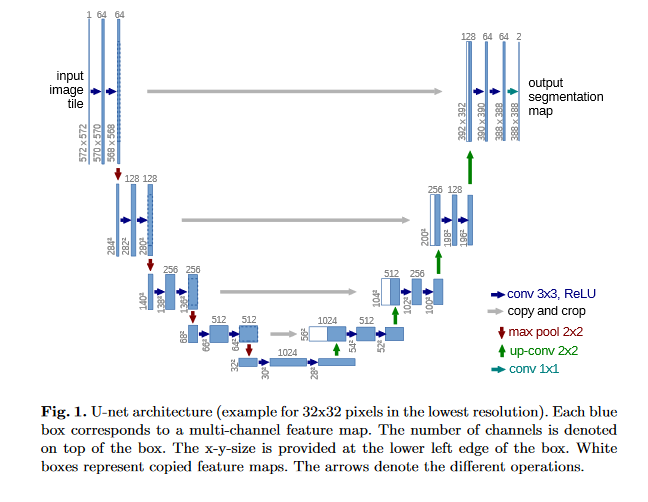

</center>

In [19]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [  #create a stack of downsample models
        downsample(64, 4, apply_norm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
      ]

    up_stack = [ #create a stack of upsample models
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
                ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 32, 32, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[None, None, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Generator
Generator is a Unet Network here since We want to translate One type of Image (digit 4) into Another type of Image (digit 9).

In [20]:
generator_g = unet_generator()
generator_f = unet_generator()

Let's also visualize one of our Generator Models since Both our Generators have same architecture.

Notice How the dimension reduces first but then increases.

In [21]:
generator_g.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 1)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential (Sequential)   │ (None, None, None, 64) │          1,024 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_1 (Sequential) │ (None, None, None,     │        131,328 │ sequential[0][0]       │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_2 (Sequential) │ (None, None, None,     │        524,800 │ sequential_1[0][0]     │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_3 (Sequential) │ (None, None, None,     │      2,098,176 │ sequential_2[0][0]     │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_4 (Sequential) │ (None, None, None,     │      4,195,328 │ sequential_3[0][0]     │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_5 (Sequential) │ (None, None, None,     │      4,195,328 │ sequential_4[0][0]     │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_6 (Sequential) │ (None, None, None,     │      4,195,328 │ sequential_5[0][0]     │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_7 (Sequential) │ (None, None, None,     │      4,195,328 │ sequential_6[0][0]     │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_8 (Sequential) │ (None, None, None,     │      4,195,328 │ sequential_7[0][0]     │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, None, None,     │              0 │ sequential_8[0][0],    │
│                           │ 128)                   │                │ sequential_6[0][0],    │
│                           │                        │                │ sequential_9[0][0],    │
│                           │                        │                │ sequential_5[0][0],    │
│                           │                        │                │ sequential_10[0][0],   │
│                           │                        │                │ sequential_4[0][0],    │
│                           │                        │                │ sequential_11[0][0],   │
│                           │                        │                │ sequential_3[0][0],    │
│                           │                        │                │ sequential_12[0][0],   │
│                           │                        │                │ sequential_2[0][0],    │
│                      

 Total params: 54,408,833 (207.55 MB)

 Trainable params: 54,408,833 (207.55 MB)

 Non-trainable params: 0 (0.00 B)

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [22]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[None, None, 1], name='input_image')
    x = inp
    down1 = downsample(64, 4,  False)(x)  #write your code to downsample X
    down2 = downsample(128, 4)(down1)     #write your code to downsample down1
    down3 = downsample(256, 4)(down2)     #write your code to downsample down2
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last) #create the model using input & output layer

In [23]:
discriminator_x = discriminator()
discriminator_y = discriminator()

Have a look at Discriminator's architecture, Notice that The Dimensions are reducing overall at the end since it's a classifier and only Convolution layers are being used.

In [24]:
discriminator_x.summary()

Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)             │ (None, None, None, 1)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_30 (Sequential)           │ (None, None, None, 64)      │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_31 (Sequential)           │ (None, None, None, 128)     │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_32 (Sequential)           │ (None, None, None, 256)     │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d (ZeroPadding2D)       │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, None, None, 512)     │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_30            │ (None, None, None, 512)     │           1,024 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_19 (LeakyReLU)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_1 (ZeroPadding2D)     │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, None, None, 1)       │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,763,521 (10.54 MB)

 Trainable params: 2,763,521 (10.54 MB)

 Non-trainable params: 0 (0.00 B)

### Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

Check output of Untrained Generator models which should be a random noise

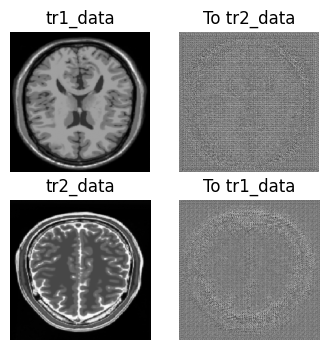

In [25]:
to_tr2_data = generator_g(sample_tr1_data)
to_tr1_data = generator_f(sample_tr2_data)
plt.figure(figsize=(4, 4))

imgs = [sample_tr1_data, to_tr2_data, sample_tr2_data, to_tr1_data]
title = ['tr1_data', 'To tr2_data', 'tr2_data', 'To tr1_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Declare Loss as Binary Cross Entropy
Since Our Discriminator is a classifier

In [26]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

In [27]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

#### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

In [28]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

#### Cycle Loss
When we use both of Generators sequentially on a Input Image, we get Cycle Image and the L1 Loss between these two is called Cycle Loss.

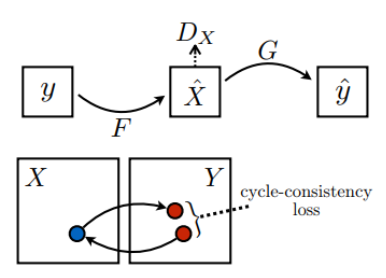

In [29]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

#### Identity Loss
When we provide input image to the Generator such that no translation is needed because the Image is already transformed. Here also we take L1 Loss between Input and Output Image.

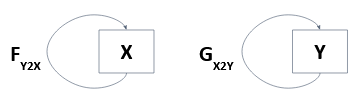

In [30]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

#### Optimizer
We use Adam Optimizer to update weights which is a good optimizer to achieve quick learning.

In [31]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

We'll train out Model for 100 Epochs

In [32]:
EPOCHS = 100

#### Checkpoint Initialization
Initialize checkpoints to save models

In [33]:
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Function to show Images output by Generators while Training

In [34]:
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Training FLow
Below Function performs one Flow of Batch Training <p>
Notice that Identity Loss and Cycle Loss are only used in training Generator and not Discriminator

Sequence of Training Flow


1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.



In [35]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

#### Train the CycleGAN Model for several Epochs
Loop training function for number of epochs and also show the output at each step. <p>
Note how Generators are getting better at producing realistic images epoch by epoch

In [36]:
def preprocess_image_train(image):
    image = tf.image.random_flip_left_right(image)
    # Resize the image before normalization
    # image = tf.image.resize(image, [32, 32])
    image = normalize(image)
    return image

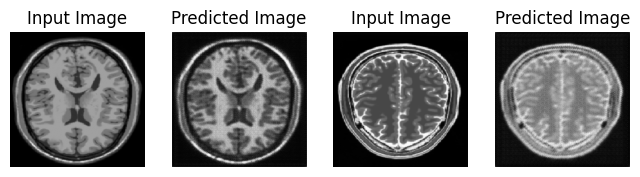

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-1


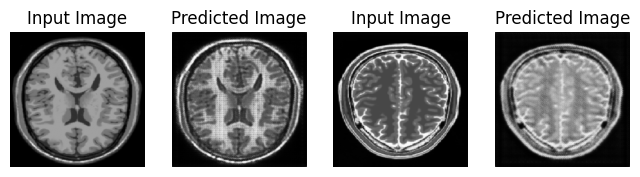

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-2


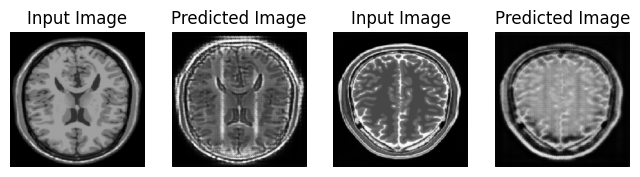

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-3


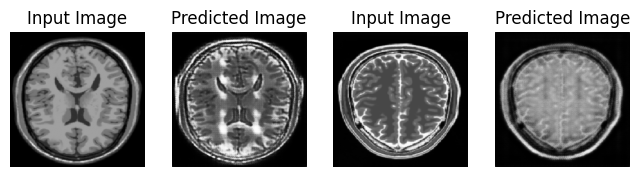

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-4


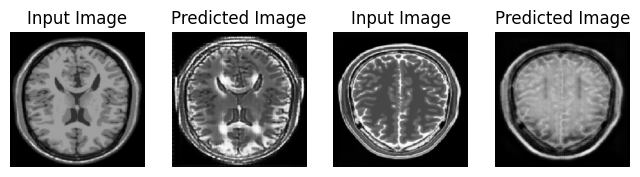

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-5


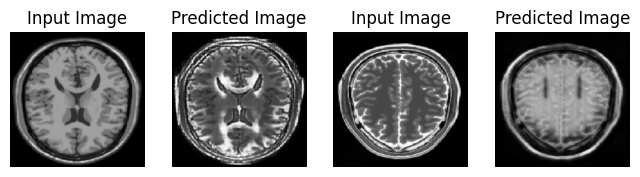

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-6


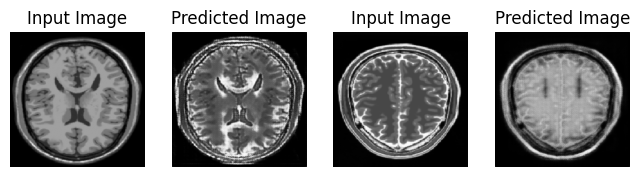

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-7


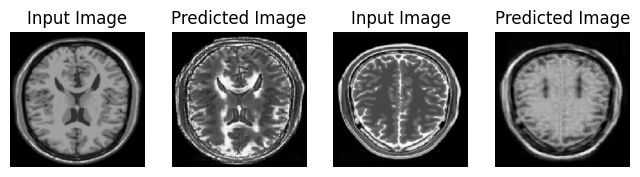

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-8


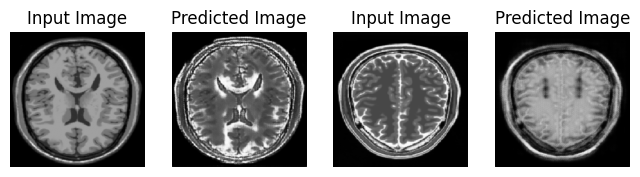

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-9


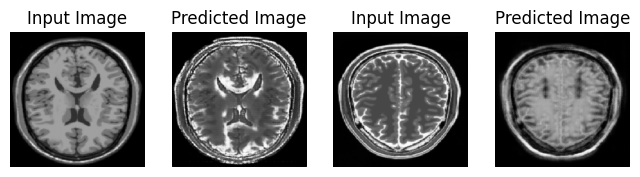

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-10


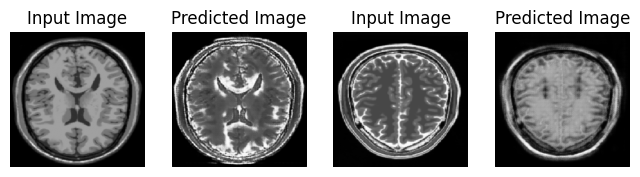

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-11


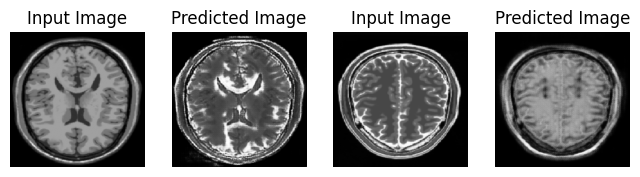

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-12


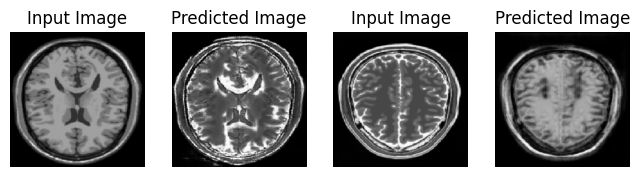

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-13


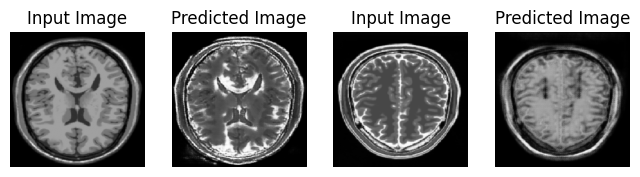

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-14


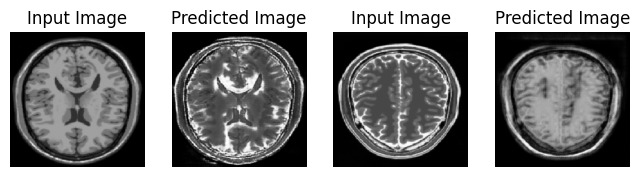

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-15


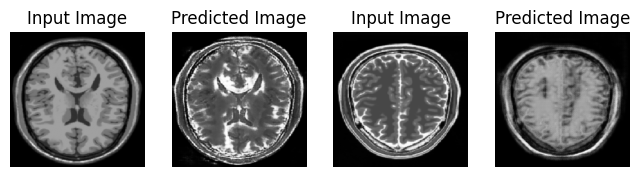

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-16


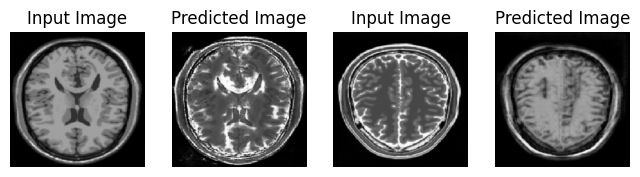

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-17


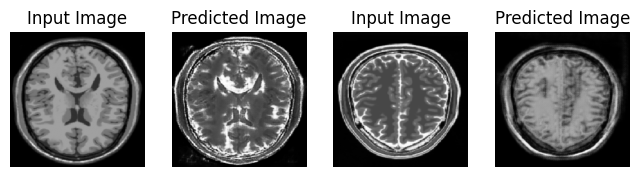

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-18


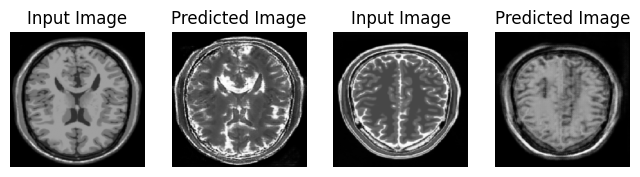

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-19


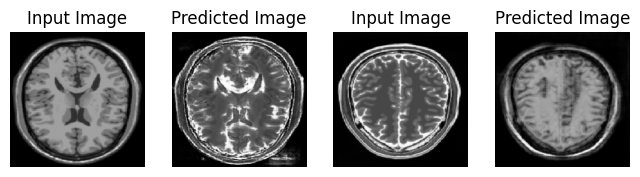

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-20


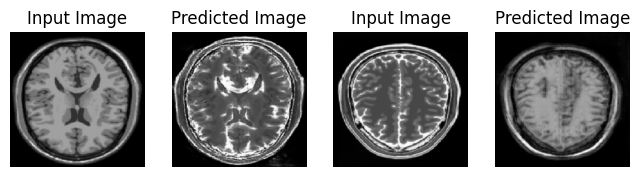

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-21


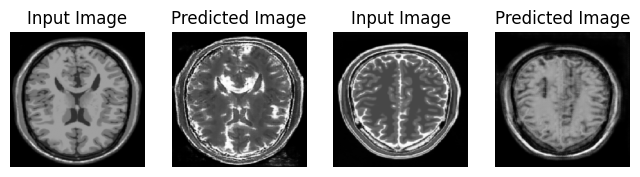

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-22


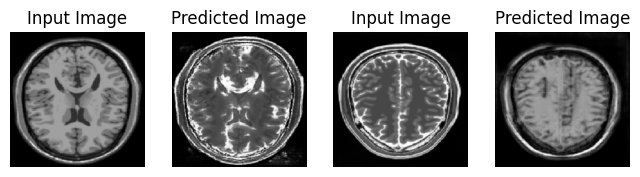

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-23


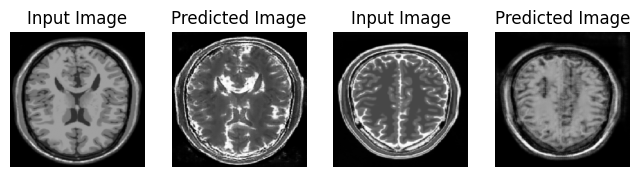

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-24


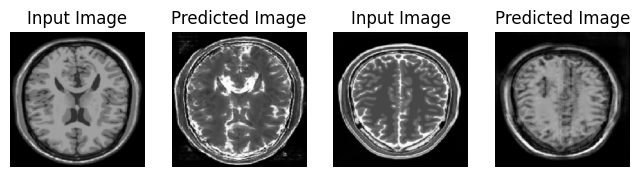

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-25


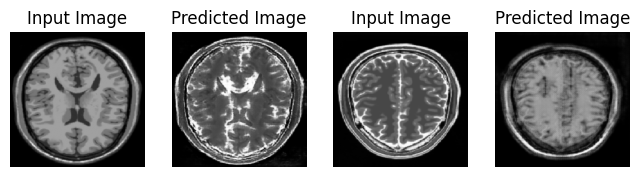

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-26


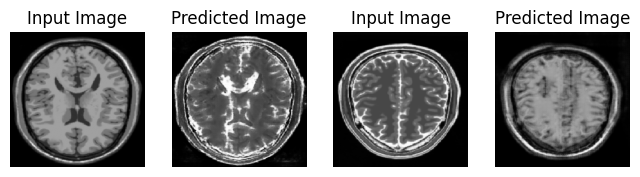

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-27


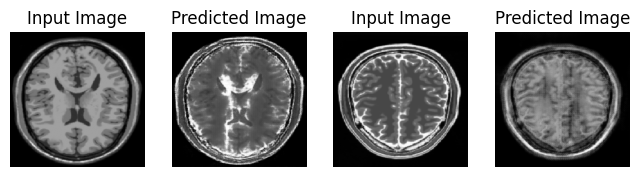

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-28


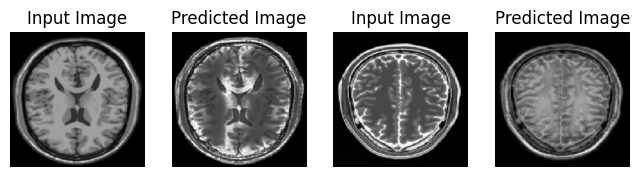

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-29


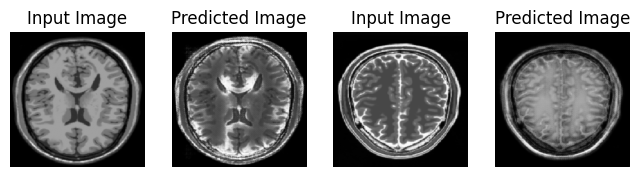

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-30


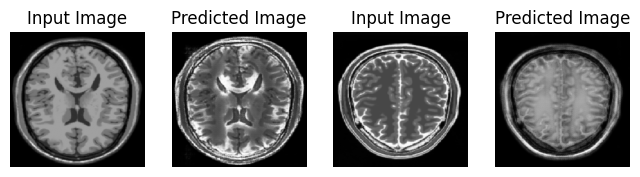

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-31


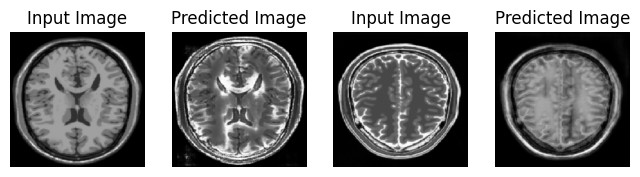

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-32


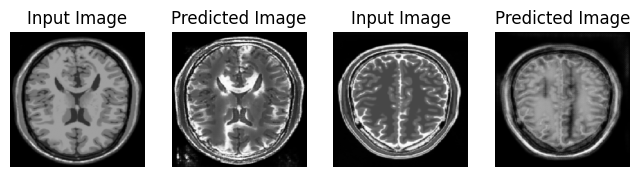

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-33


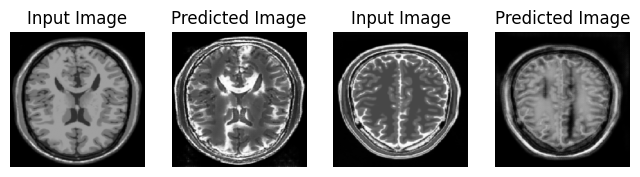

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-34


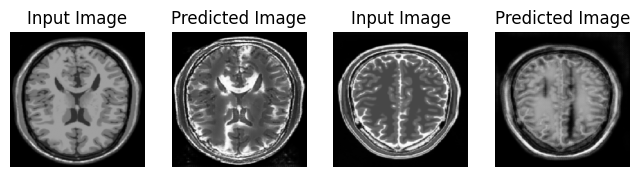

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-35


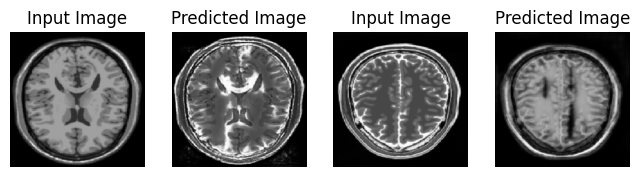

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-36


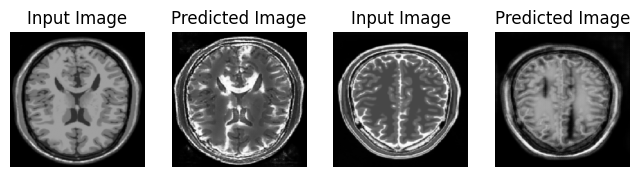

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-37


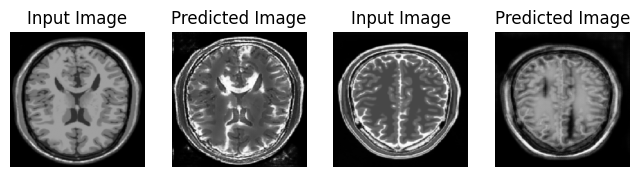

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-38


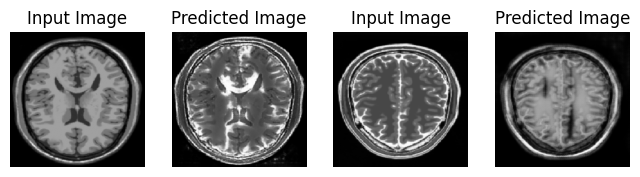

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-39


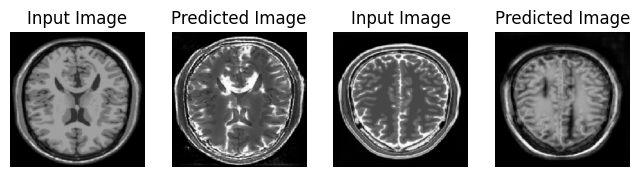

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-40


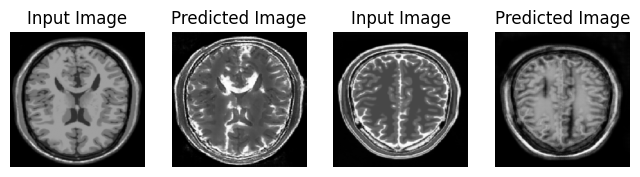

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-41


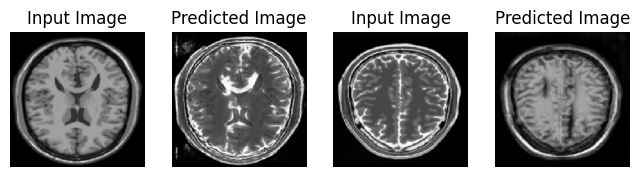

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-42


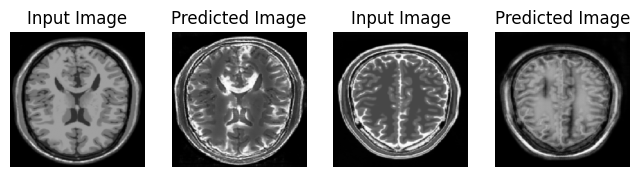

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-43


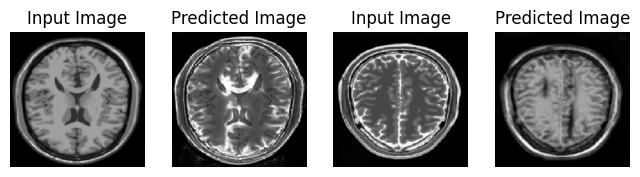

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-44


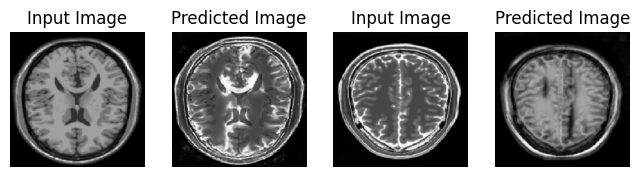

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-45


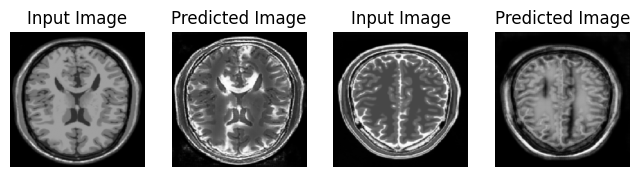

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-46


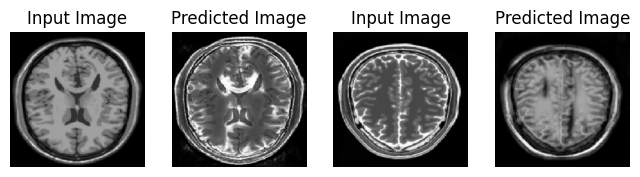

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-47


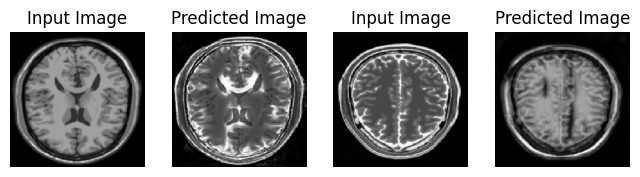

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-48


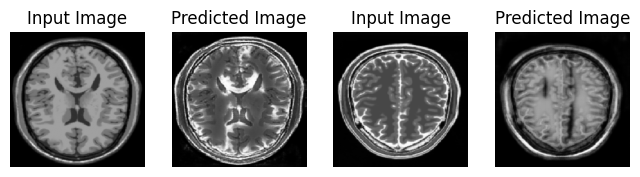

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-49


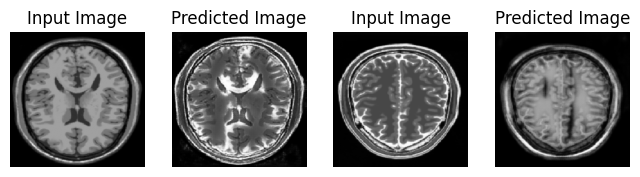

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-50


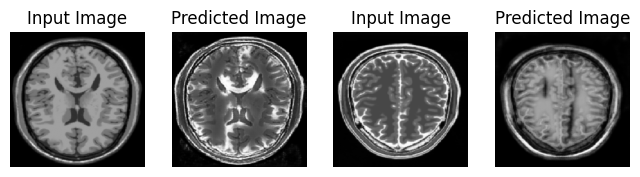

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-51


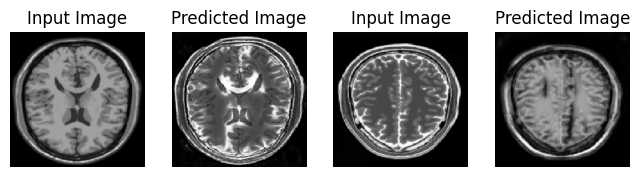

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-52


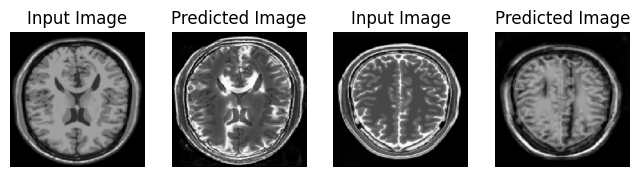

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-53


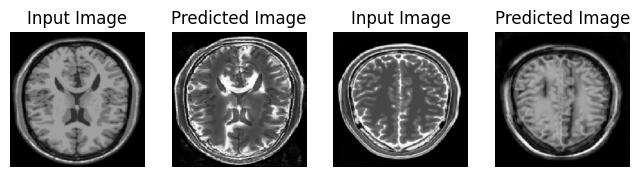

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-54


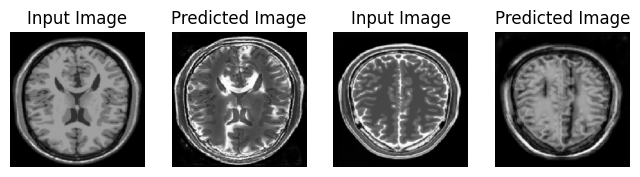

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-55


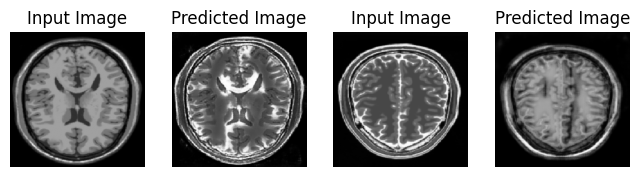

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-56


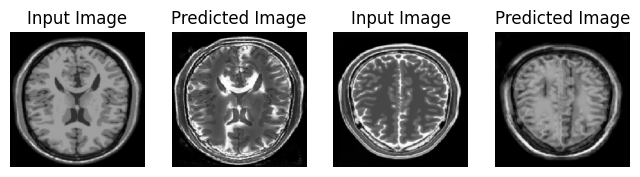

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-57


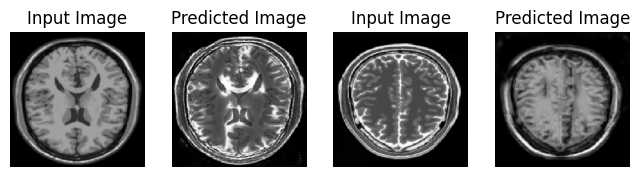

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-58


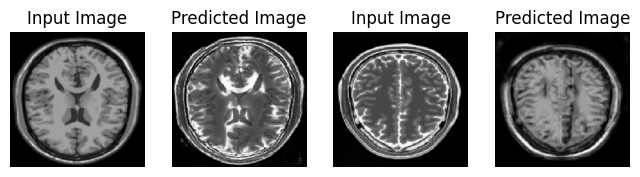

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-59


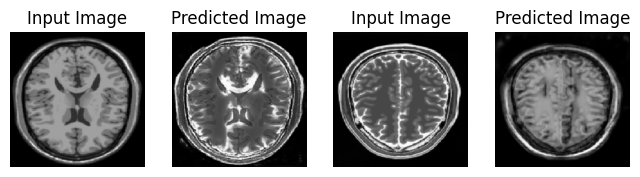

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-60


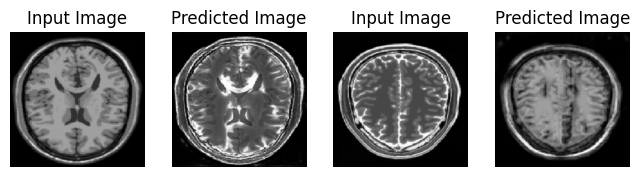

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-61


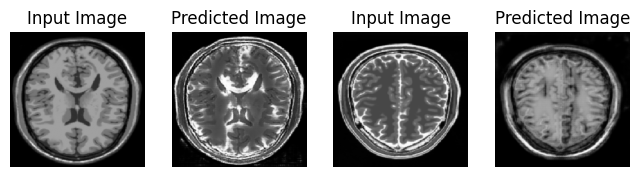

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-62


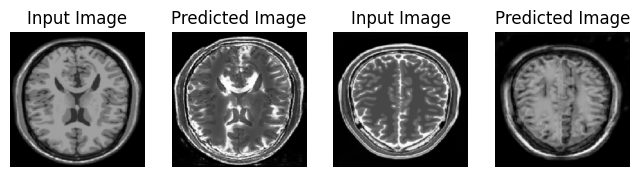

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-63


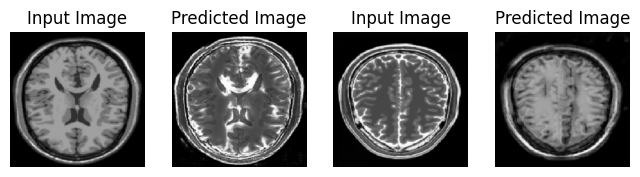

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-64


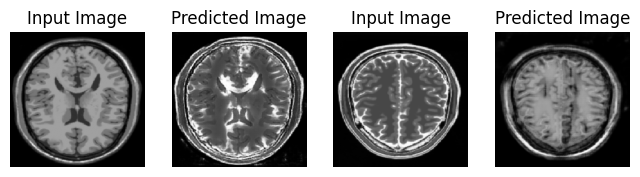

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-65


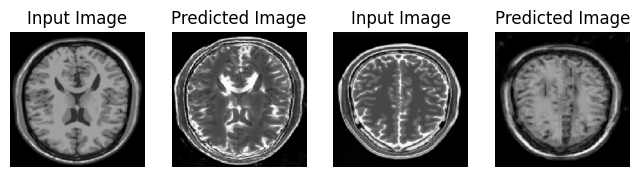

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-66


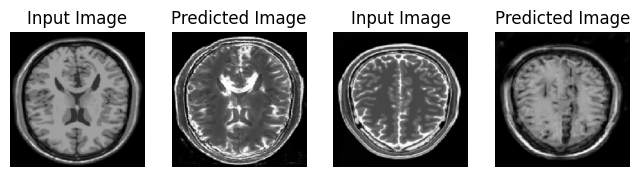

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-67


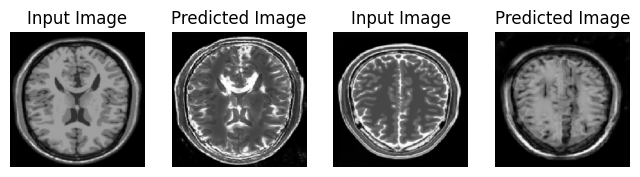

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-68


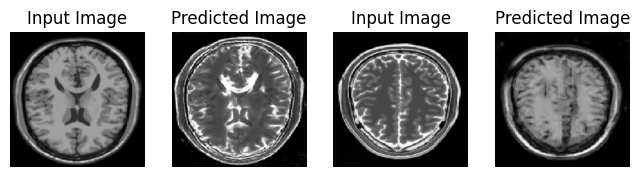

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-69


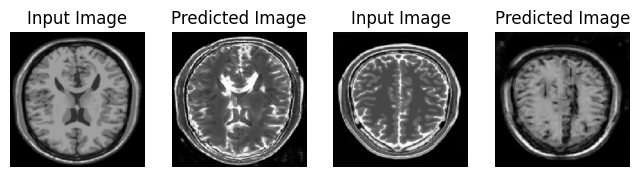

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-70


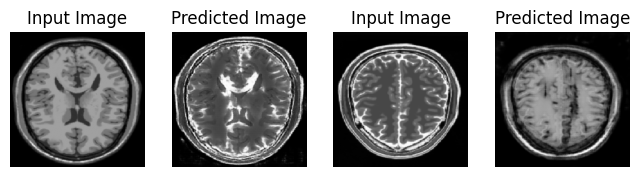

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-71


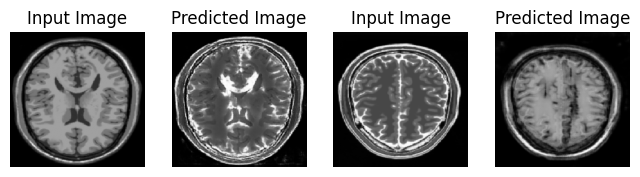

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-72


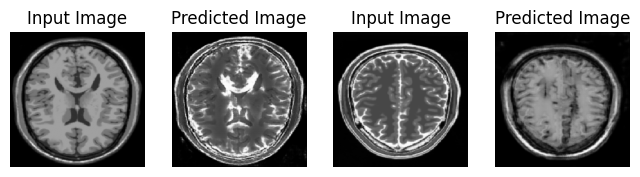

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-73


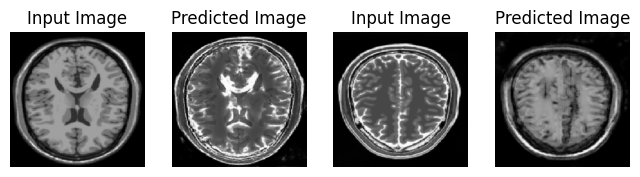

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-74


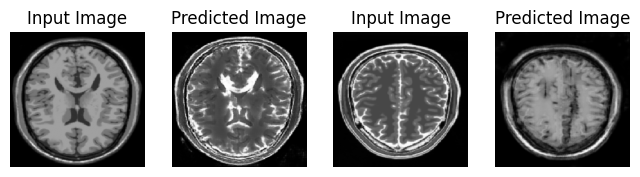

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-75


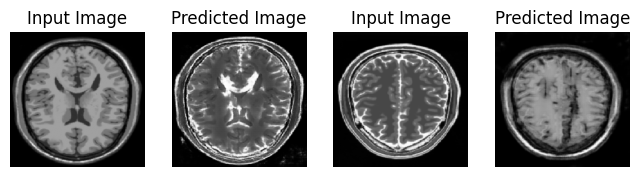

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-76


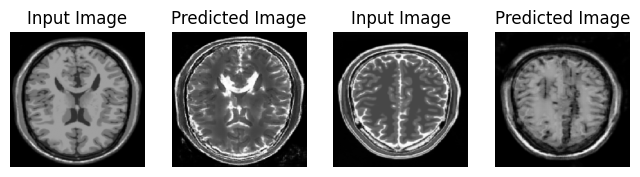

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-77


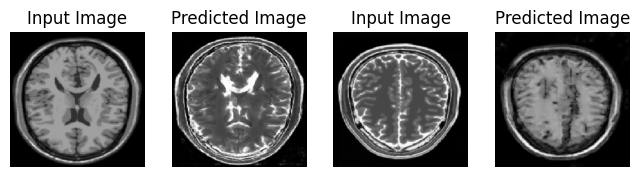

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-78


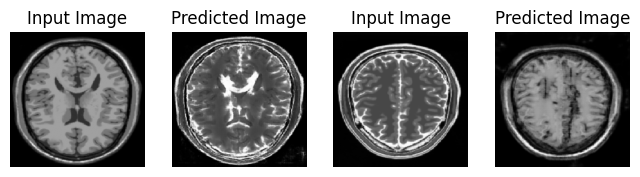

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-79


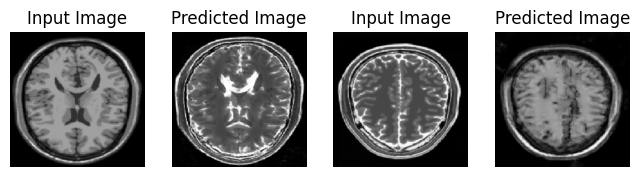

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-80


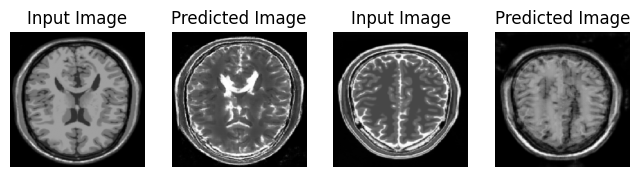

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-81


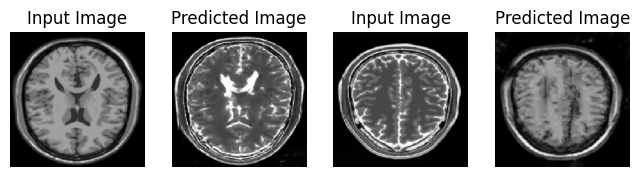

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-82


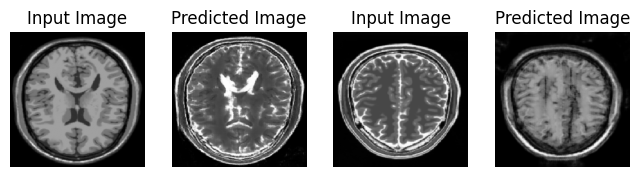

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-83


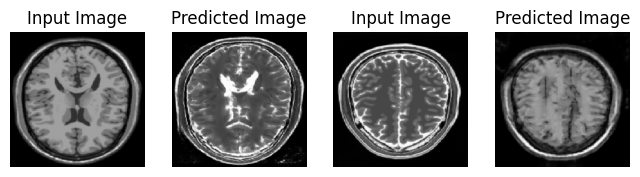

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-84


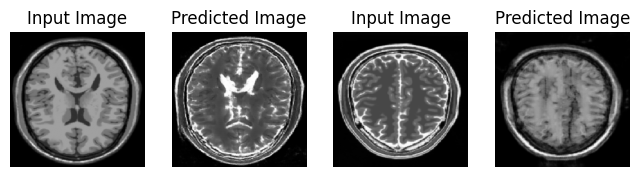

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-85


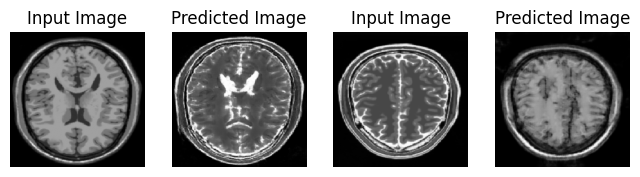

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-86


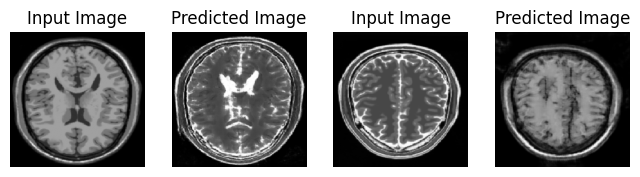

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-87


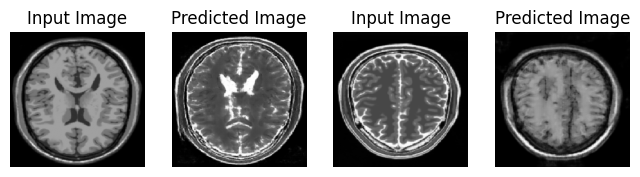

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-88


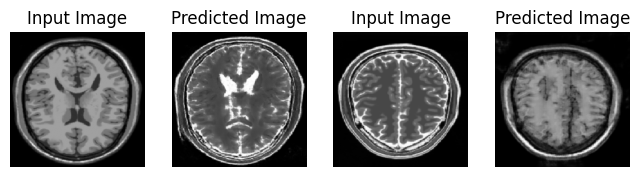

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-89


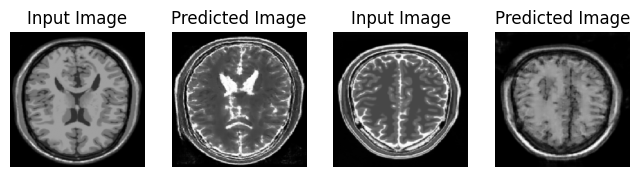

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-90


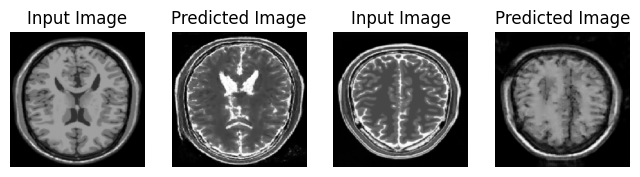

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-91


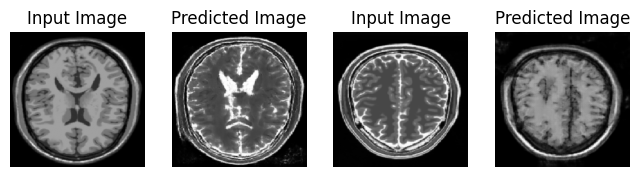

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-92


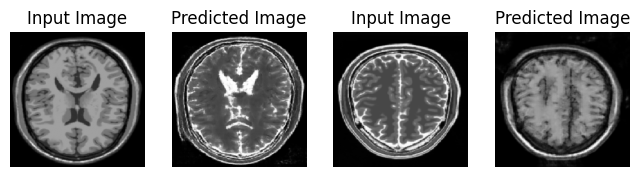

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-93


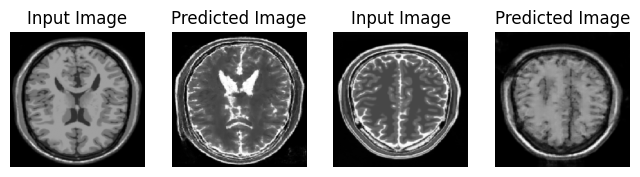

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-94


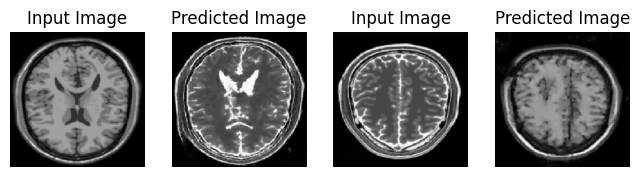

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-95


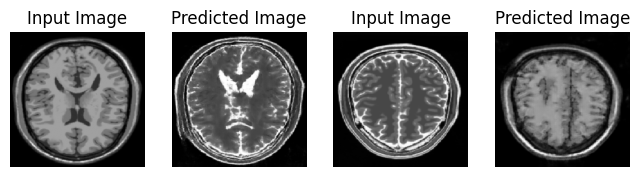

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-96


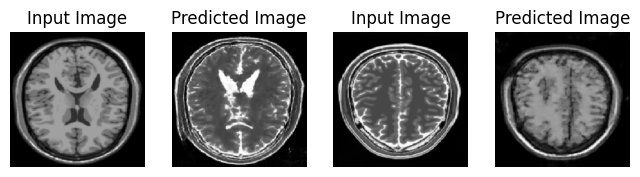

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-97


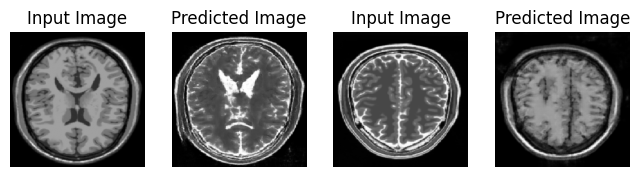

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-98


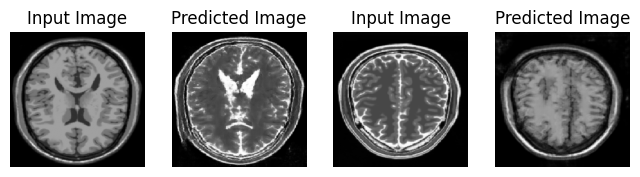

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-99


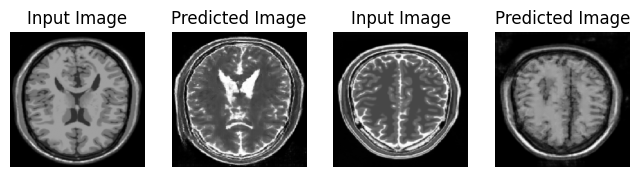

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-100


In [37]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((tr1_data, tr2_data)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_tr1_data, generator_f, sample_tr2_data)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Generating a GIF for visualization of Results
Notice the Quality of results we are getting.

In [38]:
anim_file = 'cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

<ipython-input-38-b4ad71c1b2ad>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-38-b4ad71c1b2ad>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [39]:
pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-ofh2vjrx
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-ofh2vjrx
  Resolved https://github.com/tensorflow/docs to commit 4e5dc6383212ee7c6bc04b0112ce70bcfddf8261
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2025.2.5.34841-py3-none-any.whl size=182593 sha256=81acfdd5e9ac91be31e733c7bef60a66cb574a7ef2ba037fbe9d4d8dfaefa01d
  Stored in directory: /tmp/pip-ephem-wheel-cache-dqx64axd/wheels/34/53/89/3db54cf97ce0f0261aaab3fdc12a847ea0879d34edf373e2c5
Successfully built tensorflow-docs



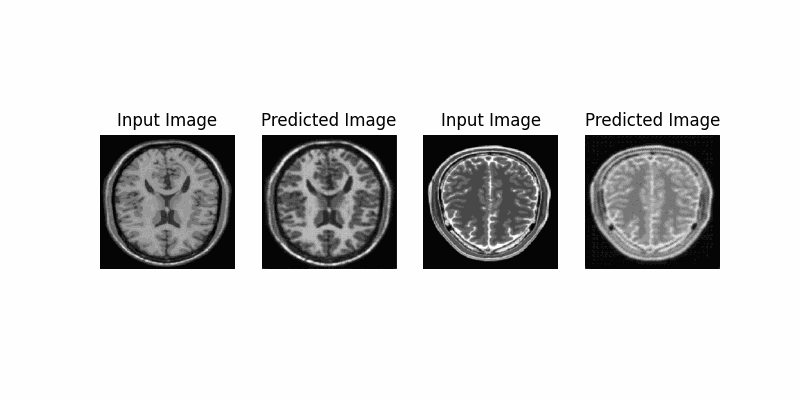

In [40]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)